# The goals / steps of this project are the following:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
1. Apply a distortion correction to raw images.
1. Use color transforms, gradients, etc., to create a thresholded binary image.
1. Apply a perspective transform to rectify binary image ("birds-eye view").
1. Detect lane pixels and fit to find the lane boundary.
1. Determine the curvature of the lane and vehicle position with respect to center.
1. Warp the detected lane boundaries back onto the original image.
1. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [1]:
import sys
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
%matplotlib inline

## 1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

In [2]:


#load calibration image
files=[]
images = glob.glob('camera_cal/calibration*.jpg')

# Find the chessboard corners (width_num and height_num) is glid numbers which are excluded outermost
width_num = 8
height_num = 6

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((height_num*width_num,3), np.float32)
# z value is always zero
objp[:,:2] = np.mgrid[0:width_num, 0:height_num].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

for idx,file_name in enumerate(images):
    img= cv2.imread(file_name)
    if idx == 0:
        img_size = (img.shape[0], img.shape[1])
    #endif
    #for prepareing to find checker-board corner
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)    
    #first output is boolian.True means specified patern is detected.and second output is value of detected point
    ret, corners = cv2.findChessboardCorners(gray, (width_num,height_num), None)
    
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
    #endif
#endfor

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "./camera_cal/pickle.p", "wb" ) )
print("finish")

finish


Text(0.5, 1.0, 'Undistorted Image')

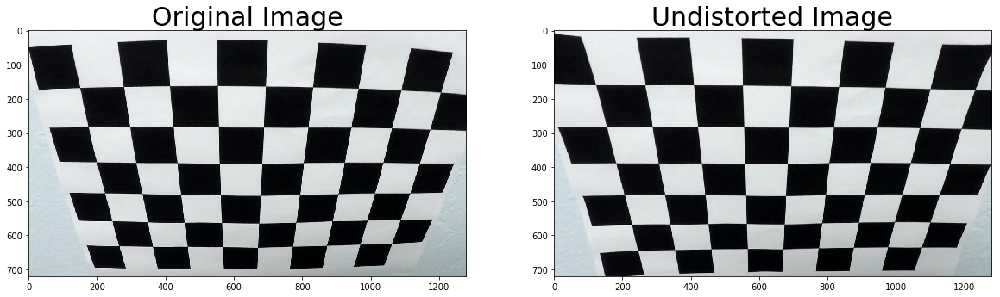

In [3]:
#result of undistorted image
img = cv2.imread('./camera_cal/calibration2.jpg')
dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('./camera_cal/calibration2_undist.jpg',dst)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

## 2. Apply a distortion correction to raw images.

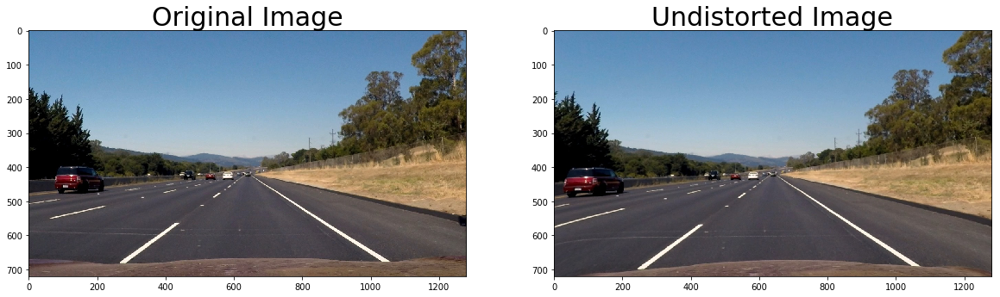

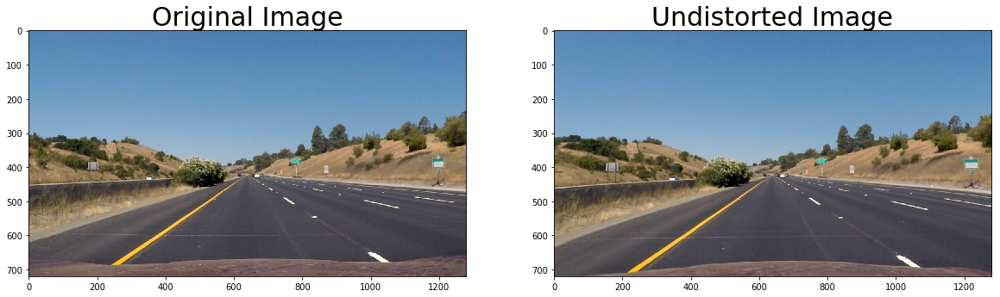

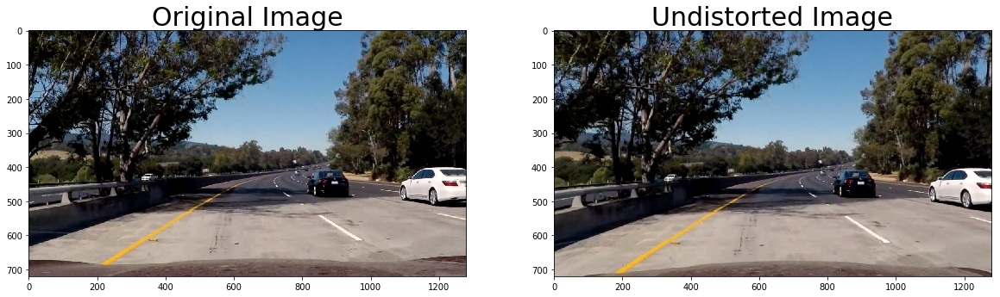

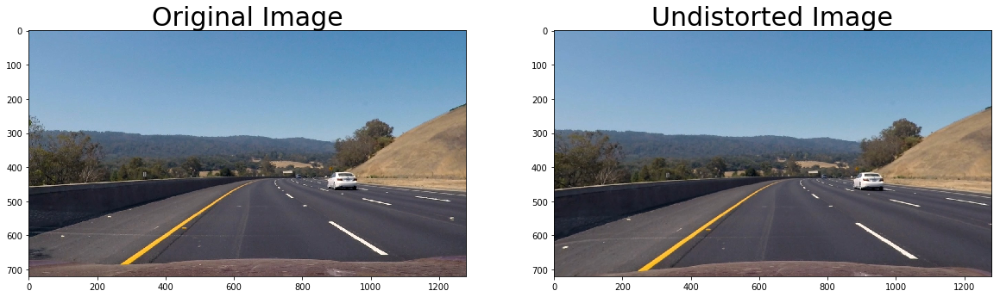

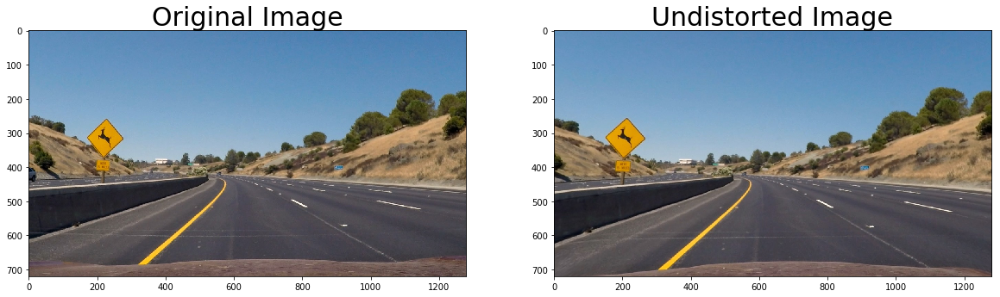

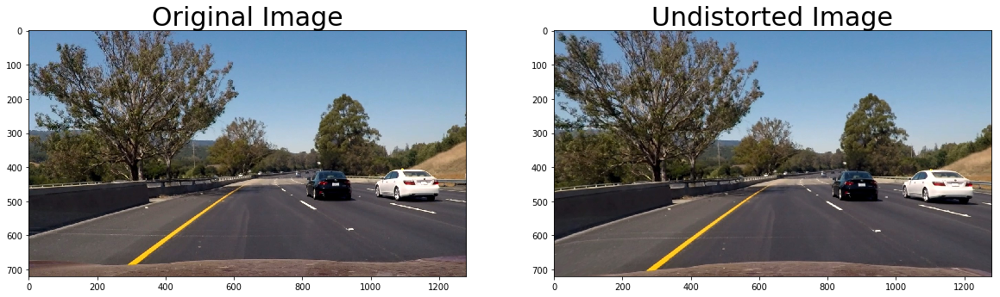

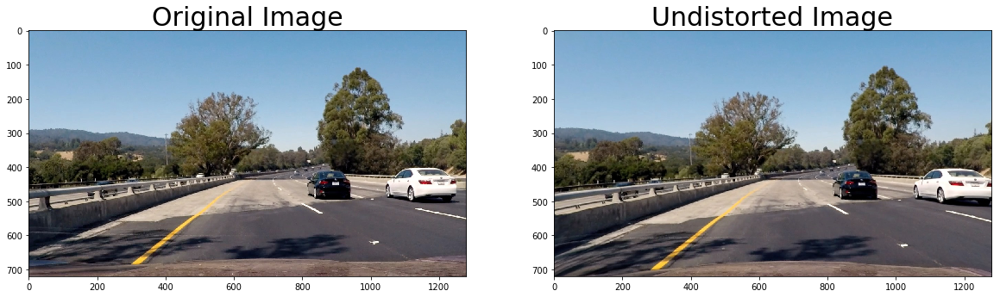

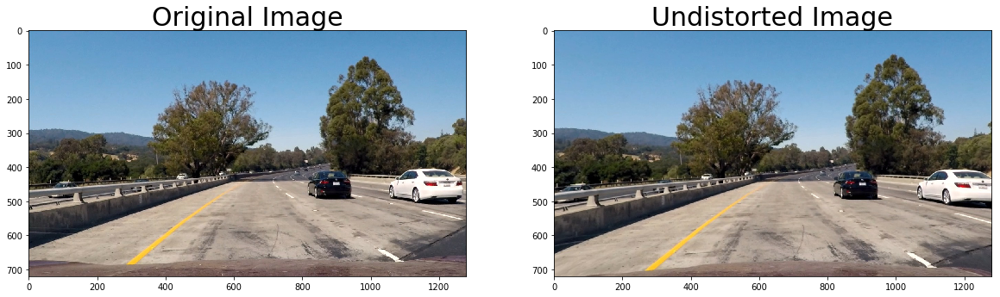

In [4]:
# load the data of calibration
dist_pickle = pickle.load(open("./camera_cal/pickle.p", "rb" ))
mtx, dist = dist_pickle["mtx"], dist_pickle["dist"]

# load test image path
images = glob.glob('./test_images/straight_lines*.jpg') + glob.glob('./test_images/test*.jpg')

for i, fname in enumerate(images):
    # original image
    img = mpimg.imread(fname)
    
    # undistort the test image
    undist_img = cv2.undistort(img, mtx, dist, None, mtx)
    # hold undistort image
    if i == 0:
        undist_images = np.reshape(undist_img,(1,undist_img.shape[0],undist_img.shape[1],undist_img.shape[2]))
    else:
        undist_images = np.concatenate([undist_images,np.reshape(undist_img,(1,undist_img.shape[0],undist_img.shape[1],undist_img.shape[2]))],axis=0)
    #endif
    
    # plot
    f, (axL, axR) = plt.subplots(1, 2, figsize=(20,10))
    axL.imshow(img)
    axL.set_title('Original Image', fontsize=30)
    axR.imshow(undist_img)
    axR.set_title('Undistorted Image', fontsize=30)
#endfor

## 3.Use color transforms, gradients, etc., to create a thresholded binary image.

In [5]:
def mag_thresh(img, sobel_kernel=15, mag_thresh=(30, 100)):
    
    # Apply the following steps to img
    # Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the magnitude 
    gradmag = np.sqrt(sobelx**2+sobely**2)
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

def dir_thresh(img, sobel_kernel=15, thresh=(0.8,1.2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    return binary_output

def mag_and_dir_thresh(img, sobel_kernel=15, mag_th=(30,100), dir_th=(0.8,1.2)):
    # Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    #Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    #Calculate the magnitude 
    gradmag = np.sqrt(sobelx**2+sobely**2)
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Take the absolute value of the gradient direction,
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(absgraddir >= dir_th[0]) & (absgraddir <= dir_th[1]) & (gradmag >= mag_th[0]) & (gradmag <= mag_th[1])] = 1
    return binary_output

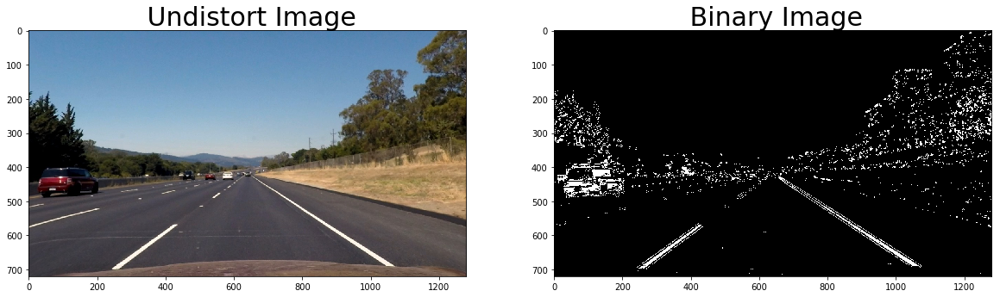

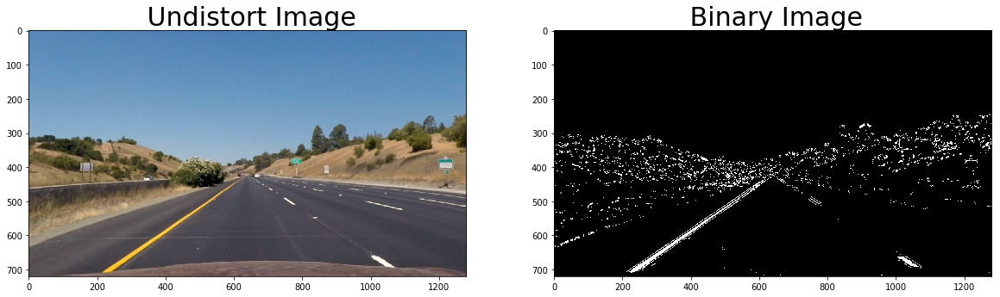

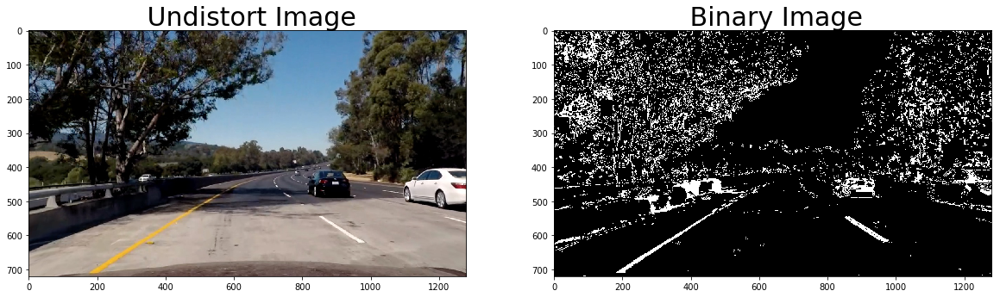

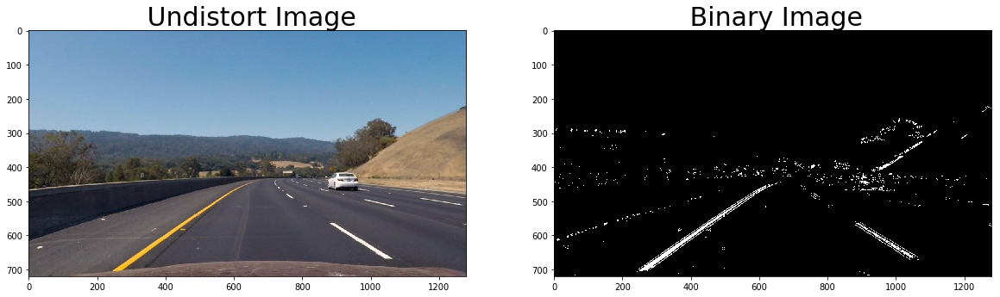

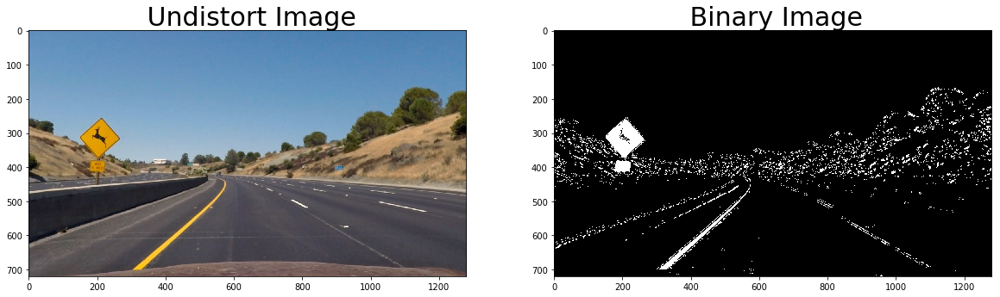

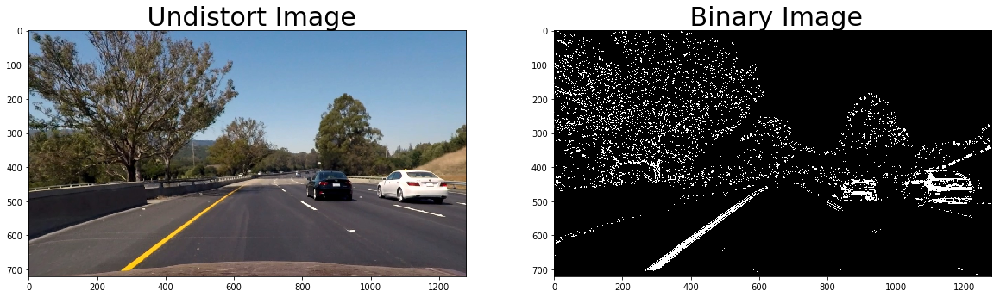

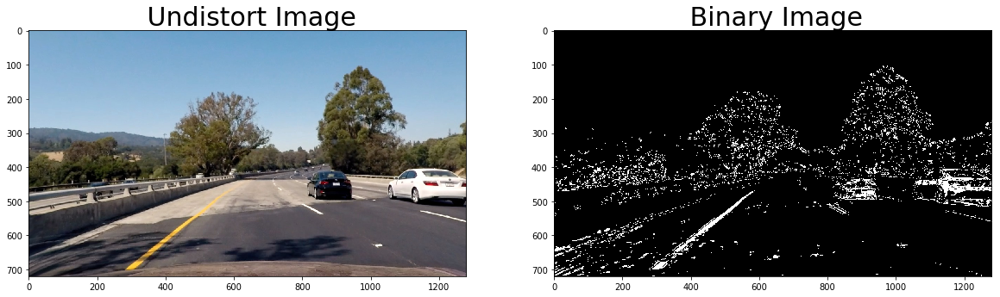

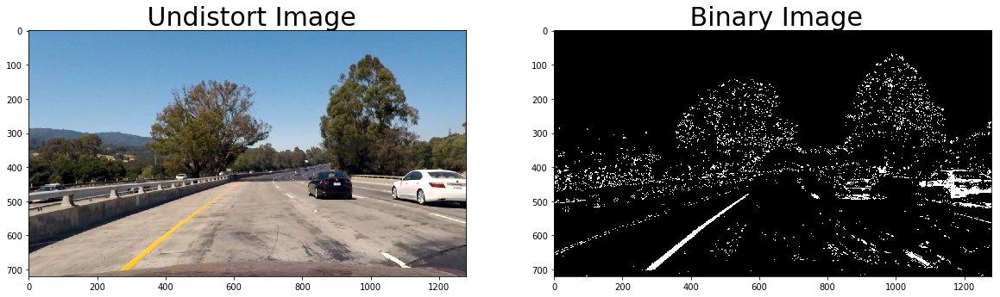

In [6]:
for i in range(undist_images.shape[0]):
    undist = np.reshape(undist_images[i,:,:,:],(undist_images.shape[1],undist_images.shape[2],undist_images.shape[3]))
    # gradient threshold
    mag_and_dir_binary = mag_and_dir_thresh(undist)
    # color threshold
    # Convert to HLS color space and separate the V channel
    s_thresh = (170, 255)
    hls = cv2.cvtColor(undist, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_thresh[0] <= s_channel) & (s_channel <= s_thresh[1])] = 1
    # conbine gradient and color threshold
    threshold_binary_img = np.zeros_like(mag_and_dir_binary)
    threshold_binary_img[(s_binary==1) | (mag_and_dir_binary==1)] = 1
    # hold binary image
    if i == 0:
        threshold_binary_images = np.reshape(threshold_binary_img,(1,threshold_binary_img.shape[0],threshold_binary_img.shape[1]))
    else:
        threshold_binary_images = np.concatenate([threshold_binary_images,np.reshape(threshold_binary_img,(1,threshold_binary_img.shape[0],threshold_binary_img.shape[1]))],axis=0)
    #endif
    f, (ax1, ax2) = plt.subplots(1, 2,figsize=(20,10))
    ax1.imshow(undist)
    ax1.set_title(' Undistort Image', fontsize=30)
    ax2.imshow(threshold_binary_img,cmap='gray')
    ax2.set_title(' Binary Image', fontsize=30)

## 4. Apply a perspective transform to rectify binary image ("birds-eye view").

I use first image to find four points lying along the lines that, after perspective transform, make the lines look straight and vertical from a bird's eye view perspective.

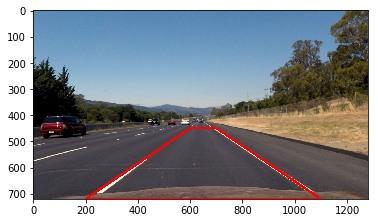

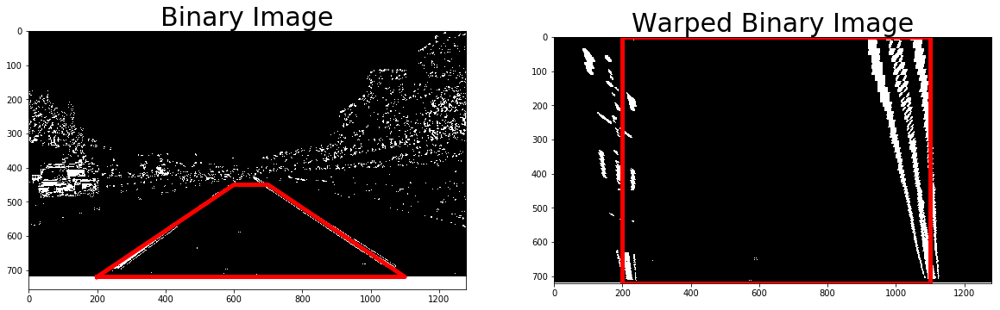

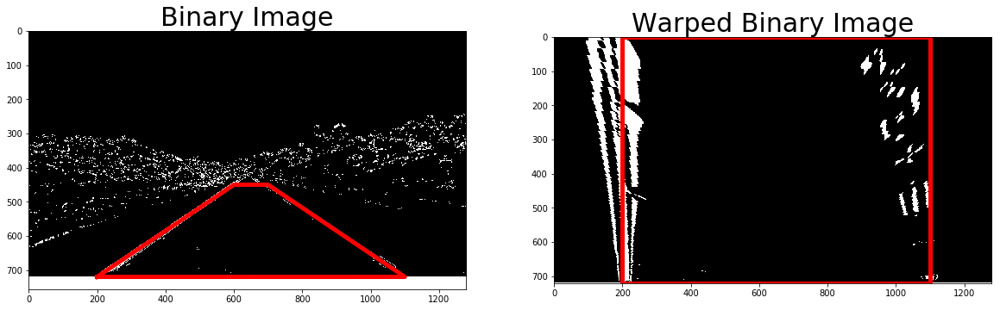

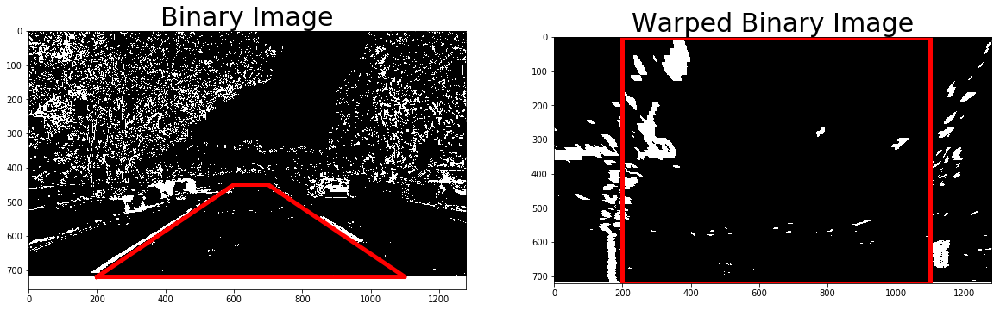

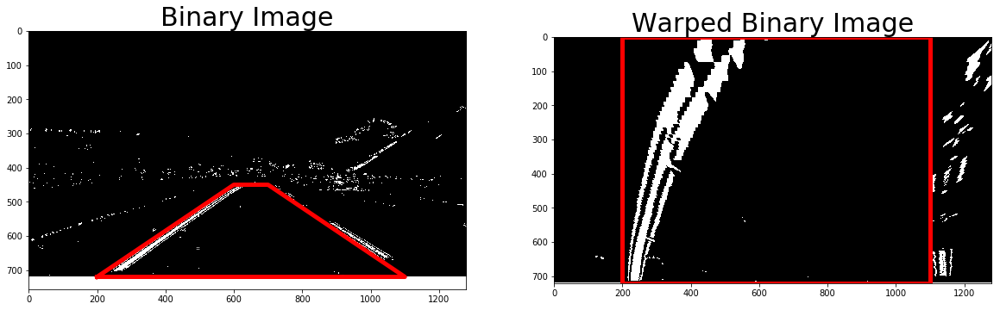

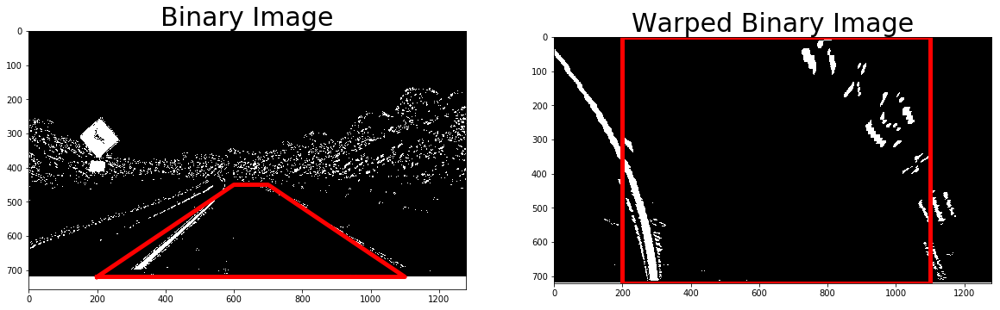

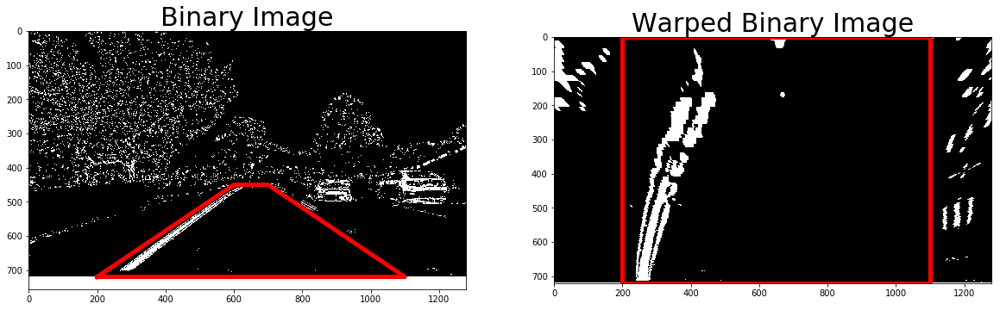

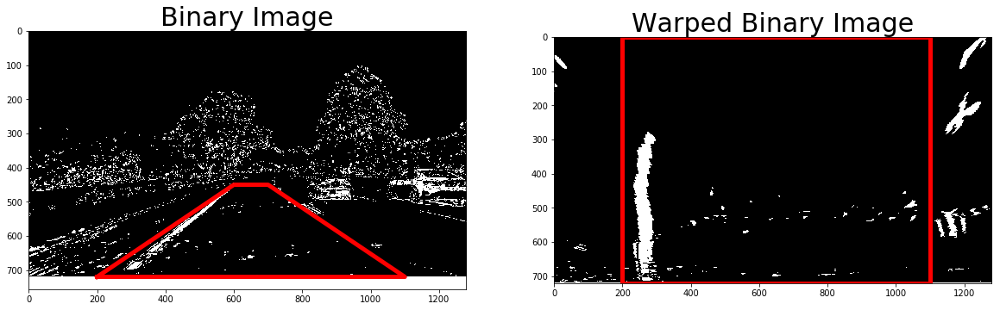

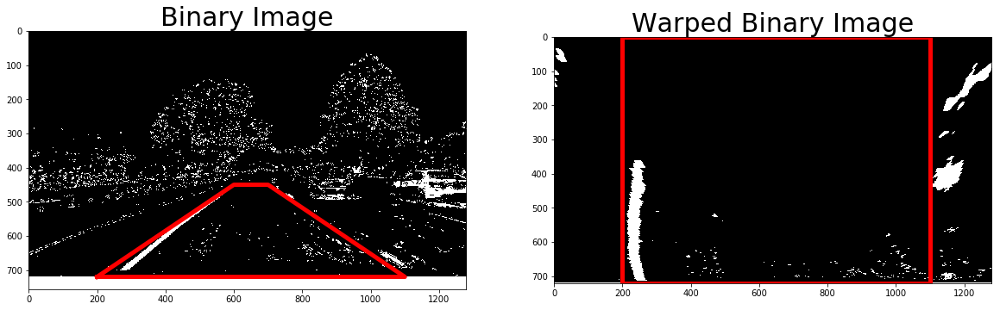

In [7]:
# choice 4 points lying along the lines in original(undistort) image.
# I use following 4 points.
#(720,200),(720,1100),(450,600),(450,700) 
#:(image.shape[0],200/1280*image_shape[1]),(image.shape[0],1100/1280*image_shape[1]),(450/720*image.shape[0],600/1280*image_shape[1]),(450/720*image.shape[0],700/1280*image_shape[1])
from PIL import Image
from PIL import ImageDraw
undist = np.reshape(undist_images[0,:,:,:],(undist_images.shape[1],undist_images.shape[2],undist_images.shape[3]))
lined_image = Image.new('RGB',(undist.shape[1] ,undist.shape[0]))
undist_image = Image.fromarray(undist)
lined_image.paste(undist_image,(0,0))
d = ImageDraw.Draw(lined_image)
d.line(((200/1280*undist.shape[1],undist.shape[0]),(1100/1280*undist.shape[1],undist.shape[0]),(700/1280*undist.shape[1],450/720*undist.shape[0]),(600/1280*undist.shape[1],450/720*undist.shape[0]),(200/1280*undist.shape[1],undist.shape[0])),fill=(255,0,0),width=10)
plt.imshow(lined_image)

# set 4 points lying along the lines in undistort image and perspective transposed image. 
src = np.float32([(200/1280*undist.shape[1],undist.shape[0]),(1100/1280*undist.shape[1],undist.shape[0]),(700/1280*undist.shape[1],450/720*undist.shape[0]),(600/1280*undist.shape[1],450/720*undist.shape[0])])
dst = np.float32([(200/1280*undist.shape[1],undist.shape[0]),(1100/1280*undist.shape[1],undist.shape[0]),(1100/1280*undist.shape[1],0),(200/1280*undist.shape[1],0)])

src_x = [src[0][0], src[1][0], src[2][0], src[3][0], src[0][0]]
src_y = [src[0][1], src[1][1], src[2][1], src[3][1], src[0][1]]
dst_x = [dst[0][0], dst[1][0], dst[2][0], dst[3][0], dst[0][0]]
dst_y = [dst[0][1], dst[1][1], dst[2][1], dst[3][1], dst[0][1]]

M = cv2.getPerspectiveTransform(src, dst)
M_inv = cv2.getPerspectiveTransform(dst, src)
img_size = (threshold_binary_images.shape[2],threshold_binary_images.shape[1])
for i in range(threshold_binary_images.shape[0]):
    threshold_binary_img = np.reshape(threshold_binary_images[i],(threshold_binary_images.shape[1],threshold_binary_images.shape[2]))
    warped_binary_img = cv2.warpPerspective(threshold_binary_img, M, img_size, flags=cv2.INTER_LINEAR)
    # hold warped-binary image
    if i == 0:
        warped_binary_images = np.reshape(warped_binary_img,(1,warped_binary_img.shape[0],warped_binary_img.shape[1]))
    else:
        warped_binary_images = np.concatenate([warped_binary_images,np.reshape(warped_binary_img,(1,warped_binary_img.shape[0],warped_binary_img.shape[1]))],axis=0)
    #endif
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(threshold_binary_img, cmap='gray')
    ax1.plot(src_x, src_y, color='red', linewidth=5)
    ax1.set_title('Binary Image', fontsize=30)
    ax2.imshow(warped_binary_img, cmap='gray')
    ax2.plot(dst_x, dst_y, color='red', linewidth=5)
    ax2.set_ylim([warped_binary_img.shape[0], 0])
    ax2.set_title('Warped Binary Image', fontsize=30)
    

## 5. Detect lane pixels and fit to find the lane boundary.

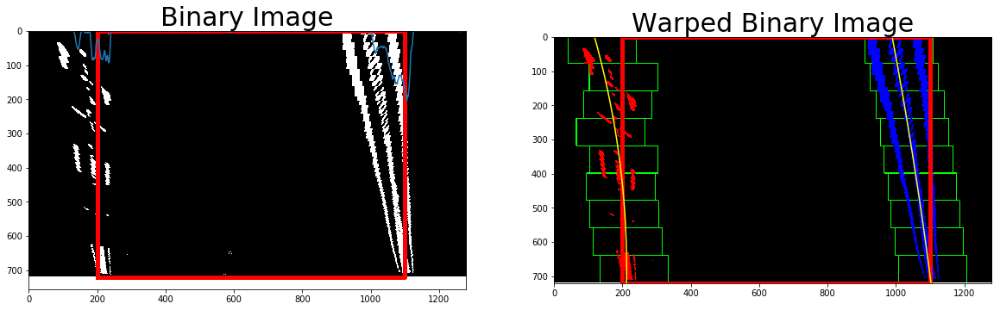

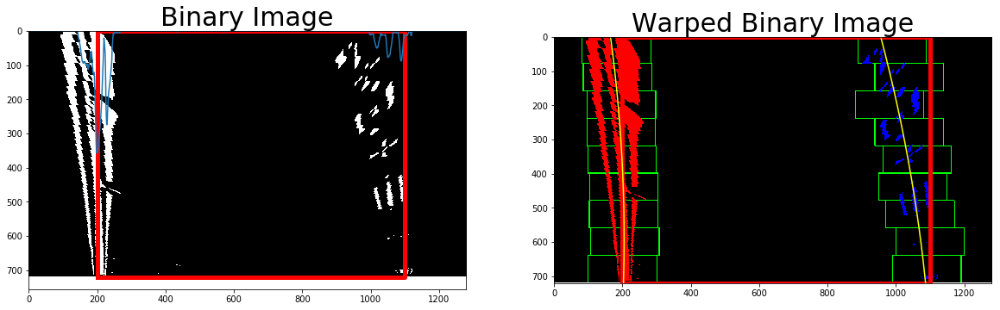

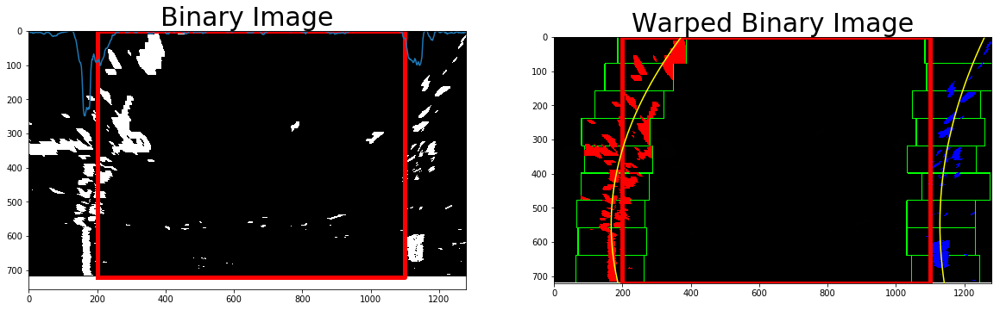

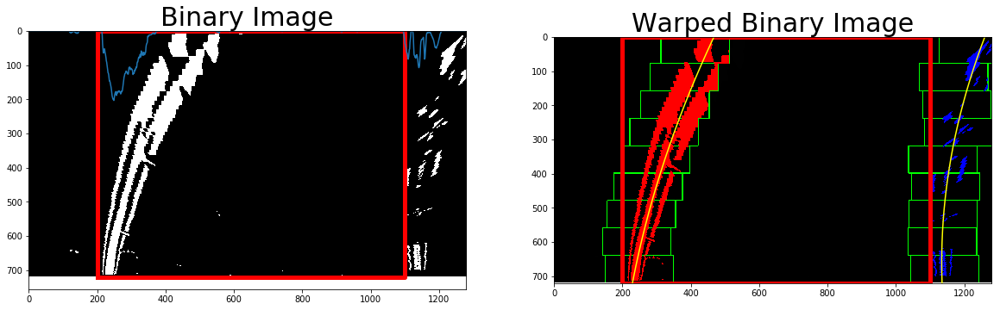

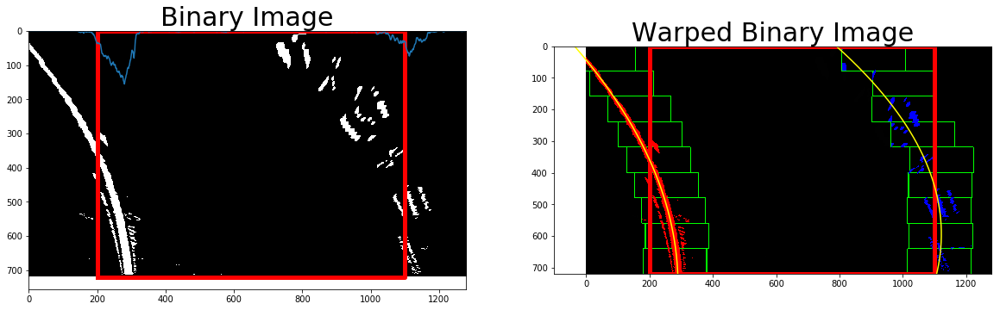

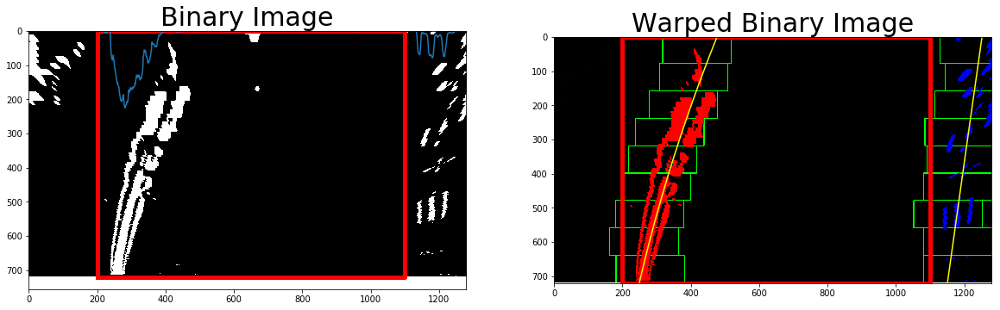

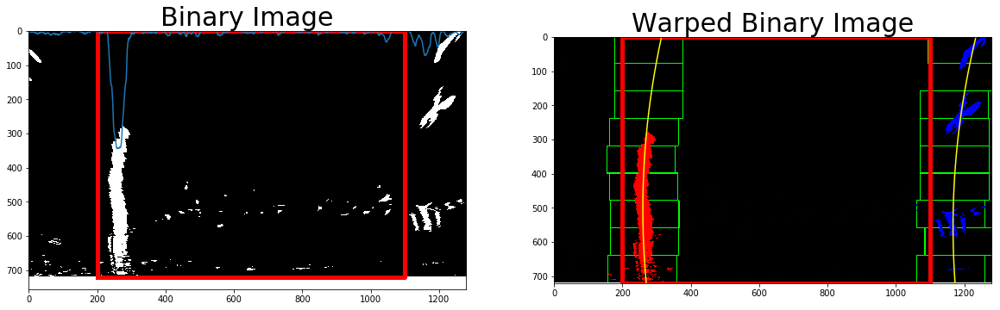

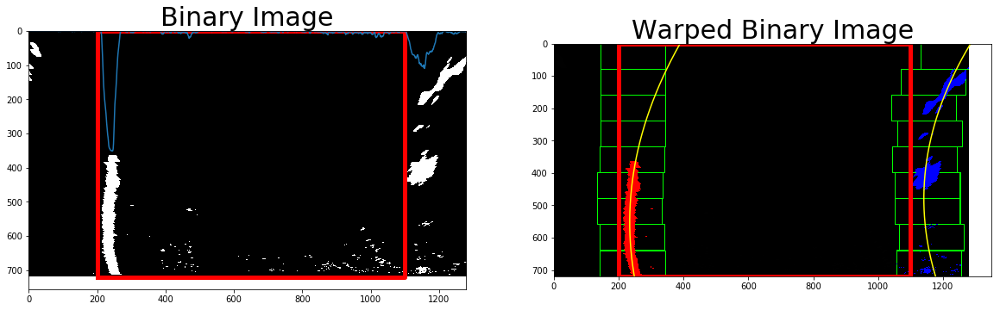

In [12]:
# HYPERPARAMETERS
# Choose the number of sliding windows
nwindows = 9
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50

# Set height of windows - based on nwindows above and image shape
window_height = np.int(warped_binary_img.shape[0]//nwindows)

# fitting result memory
fitting_result_array_real = np.zeros((warped_binary_images.shape[0],6)) #[left_fit[0]~[2],right_fit[0]~[2]]
fitting_result_array_img = np.zeros((warped_binary_images.shape[0],6))

# Identify the x and y positions of all nonzero (i.e. activated) pixels in the image
for i in range(warped_binary_images.shape[0]):
    warped_binary_img = np.reshape(warped_binary_images[i],(warped_binary_images.shape[1],warped_binary_images.shape[2]))
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((warped_binary_img,warped_binary_img,warped_binary_img))
    # calculate histgram
    bottom_half_binary_img =  warped_binary_img[warped_binary_img.shape[0]//2:,:]
    histogram = np.sum(bottom_half_binary_img,axis=0)
    # split the histgram for the left and right line and find the peak of the left and right halves of the histogram
    midpoint = np.int(histogram.shape[0]//2)
    # set the first position of search window.
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    nonzero = warped_binary_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
        win_y_low = warped_binary_img.shape[0] - (window+1)*window_height
        win_y_high = warped_binary_img.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    #endfor
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # it a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    fitting_result_array_img[i,:3]= left_fit
    fitting_result_array_img[i,3:] = right_fit
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped_binary_img.shape[0]-1, warped_binary_img.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    # Visualization
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(warped_binary_img, cmap='gray')
    ax1.plot(dst_x, dst_y, color='red', linewidth=5)
    ax1.plot(histogram)
    ax1.set_title('Binary Image', fontsize=30)
    ax2.imshow(out_img)
    ax2.plot(dst_x, dst_y, color='red', linewidth=5)
    ax2.set_ylim([out_img.shape[0], 0])
    ax2.set_title('Warped Binary Image', fontsize=30)
    # Plots the left and right polynomials on the lane lines
    ax2.plot(left_fitx, ploty, color='yellow')
    ax2.plot(right_fitx, ploty, color='yellow')
    
    # from pixel world to real world
    ym_per_pix = 30/720  #[m/pixel] in y dimension
    xm_per_pix = 3.7/700 #[m/pixel] in x dimension
    left_fit_real = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_real = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    fitting_result_array_real[i,:3]= left_fit_real
    fitting_result_array_real[i,3:] = right_fit_real
    

## 6. Determine the curvature of the lane and vehicle position with respect to center.

In [44]:
# from pixel world to real world
ym_per_pix = 30/720  #[m/pixel] in y dimension
xm_per_pix = 3.7/700 #[m/pixel] in x dimension

ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
print(ploty.shape)
ploty_inverse = np.linspace(719, 0, num=720)
fitting_result_array = fitting_result_array_real
print(fitting_result_array)

#the bottom of the image
y_eval = np.max(ploty)

for i in range(fitting_result_array.shape[0]):
    # Implement the calculation of R_curve (radius of curvature) (ref. formula) 
    left_curverad = ((1 + (2*fitting_result_array[i,0]*y_eval*ym_per_pix + fitting_result_array[i,1])**2)**1.5) / np.absolute(2*fitting_result_array[i,0])
    right_curverad = ((1 + (2*fitting_result_array[i,3]*y_eval*ym_per_pix + fitting_result_array[i,4])**2)**1.5) / np.absolute(2*fitting_result_array[i,3])
    print(left_curverad, 'm', right_curverad, 'm')
    left_bottom_x = fitting_result_array[i,0]*(y_eval*ym_per_pix)**2 + fitting_result_array[i,1]*(y_eval*ym_per_pix) + fitting_result_array[i,2]
    right_bottom_x = fitting_result_array[i,3]*(y_eval*ym_per_pix)**2 + fitting_result_array[i,4]*(y_eval*ym_per_pix) + fitting_result_array[i,5]
    vehicle_position = (img_size[0]/2*xm_per_pix-(left_bottom_x+right_bottom_x)/2)#from center to the right
    print(vehicle_position)
    print((left_bottom_x+right_bottom_x)/2)

(720,)
[[-6.23467900e-04  3.51139845e-02  6.29160555e-01 -1.22738015e-04
   2.36456871e-02  5.23010815e+00]
 [-3.46833227e-04  1.70359287e-02  8.75575426e-01 -3.43608846e-04
   3.33498793e-02  5.05328700e+00]
 [ 2.06378803e-03 -9.44459983e-02  1.96528561e+00  1.31888827e-03
  -6.03059002e-02  6.65602861e+00]
 [ 5.85469163e-04 -5.94514825e-02  2.47083014e+00  8.77527851e-04
  -4.82834927e-02  6.65851780e+00]
 [-1.74142523e-03  1.09607865e-01 -1.90648287e-01 -2.85734277e-03
   1.41477056e-01  4.17612461e+00]
 [ 3.58852938e-04 -5.07200476e-02  2.51866857e+00  6.74264176e-06
  -1.79836016e-02  6.61644929e+00]
 [ 6.52137808e-04 -2.73685308e-02  1.66142503e+00  6.58486981e-04
  -3.04570439e-02  6.52159148e+00]
 [ 1.55243397e-03 -7.14063014e-02  2.05703669e+00  1.91081569e-03
  -7.63353139e-02  6.79543896e+00]]
801.9719550192407 m 4075.3394769294187 m
-0.09208757115085664
3.4749447140079996
1441.645379421353 m 1455.4984895233831 m
-0.0264750061868253
3.4093321490439683
242.5830640291315 m 379

## 7. Warp the detected lane boundaries back onto the original image.

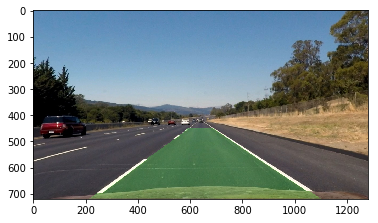

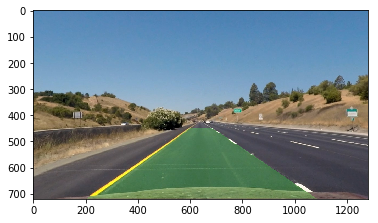

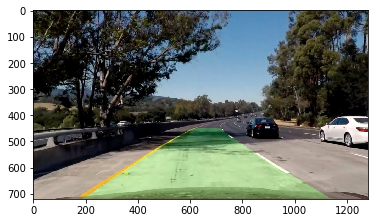

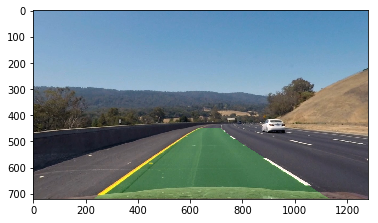

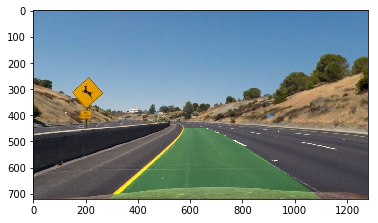

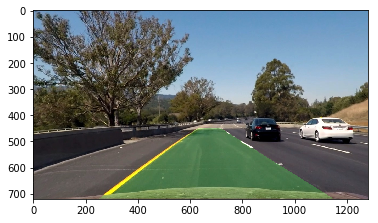

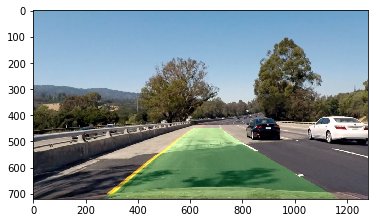

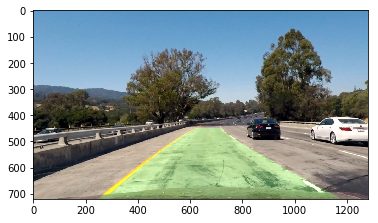

In [48]:
fitting_result_array = fitting_result_array_img
for i in range(undist_images.shape[0]):
    undist = np.reshape(undist_images[i,:,:,:],(undist_images.shape[1],undist_images.shape[2],undist_images.shape[3]))
    # for overray lane area
    lane_area = np.zeros_like(undist)
    warped_area = cv2.warpPerspective(lane_area, M, img_size, flags=cv2.INTER_LINEAR)
    left_fitx = fitting_result_array[i,0]*ploty**2 +  fitting_result_array[i,1] * ploty+ fitting_result_array[i,2]
    right_fitx = fitting_result_array[i,3]*ploty_inverse**2 +  fitting_result_array[i,4] * ploty_inverse+ fitting_result_array[i,5]
    #point = np.append(point,(right_fitx,ploty))
    pts_left = np.reshape(np.transpose(np.stack((left_fitx, ploty),axis=0)),(1,ploty.shape[0], 2))
    pts_right = np.reshape(np.transpose(np.stack((right_fitx, ploty_inverse),axis=0)),(1,ploty.shape[0], 2))
    pts = np.concatenate((pts_left, pts_right),axis=1)
    lane_area_overrayed = cv2.fillPoly(warped_area,np.int_([pts]), (0, 255, 0))
    unwarped_lane_area_overrayed_img = cv2.warpPerspective(lane_area_overrayed, M_inv, img_size, flags=cv2.INTER_LINEAR)
    lane_area_overrayed_img = cv2.addWeighted(undist, 1, unwarped_lane_area_overrayed_img, 0.2, 0)
    plt.imshow(lane_area_overrayed_img)
    plt.show()


## 8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [52]:
# load the data of calibration
dist_pickle = pickle.load(open("./camera_cal/pickle.p", "rb" ))
mtx, dist = dist_pickle["mtx"], dist_pickle["dist"]
# HYPERPARAMETERS
# Choose the number of sliding windows
nwindows = 9
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# from pixel world to real world
ym_per_pix = 30/720  #[m/pixel] in y dimension
xm_per_pix = 3.7/700 #[m/pixel] in x dimension
# Set height of windows - based on nwindows above and image shape
window_height = np.int(warped_binary_img.shape[0]//nwindows)


# for perspective transfrom,set 4 points lying along the lines in undistort image and perspective transposed image. 
src = np.float32([(200/1280*undist.shape[1],undist.shape[0]),(1100/1280*undist.shape[1],undist.shape[0]),(700/1280*undist.shape[1],450/720*undist.shape[0]),(600/1280*undist.shape[1],450/720*undist.shape[0])])
dst = np.float32([(200/1280*undist.shape[1],undist.shape[0]),(1100/1280*undist.shape[1],undist.shape[0]),(1100/1280*undist.shape[1],0),(200/1280*undist.shape[1],0)])

src_x = [src[0][0], src[1][0], src[2][0], src[3][0], src[0][0]]
src_y = [src[0][1], src[1][1], src[2][1], src[3][1], src[0][1]]
dst_x = [dst[0][0], dst[1][0], dst[2][0], dst[3][0], dst[0][0]]
dst_y = [dst[0][1], dst[1][1], dst[2][1], dst[3][1], dst[0][1]]

M = cv2.getPerspectiveTransform(src, dst)
M_inv = cv2.getPerspectiveTransform(dst, src)


def process_image(image):
    img_size = (image.shape[1],image.shape[0])
    
    ## undistort image
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    
    ## threshold and generate binary image
    mag_and_dir_binary = mag_and_dir_thresh(undist)
    # color threshold
    # Convert to HLS color space and separate the V channel
    s_thresh = (170, 255)
    hls = cv2.cvtColor(undist, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_thresh[0] <= s_channel) & (s_channel <= s_thresh[1])] = 1
    # conbine gradient and color threshold
    threshold_binary_img = np.zeros_like(mag_and_dir_binary)
    threshold_binary_img[(s_binary==1) | (mag_and_dir_binary==1)] = 1
    
    ## perspective transform
    warped_binary_img = cv2.warpPerspective(threshold_binary_img, M, img_size, flags=cv2.INTER_LINEAR)
    
    ## Detect lane pixels and fit to find the lane boundary
    # calculate histgram
    bottom_half_binary_img =  warped_binary_img[warped_binary_img.shape[0]//2:,:]
    histogram = np.sum(bottom_half_binary_img,axis=0)
    # split the histgram for the left and right line and find the peak of the left and right halves of the histogram
    midpoint = np.int(histogram.shape[0]//2)
    # set the first position of search window.
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    nonzero = warped_binary_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
        win_y_low = warped_binary_img.shape[0] - (window+1)*window_height
        win_y_high = warped_binary_img.shape[0] - window*window_height
        # Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window #
        # (`right` or `leftx_current`) on their mean position #
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    #endfor
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # it a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped_binary_img.shape[0]-1, warped_binary_img.shape[0] )
    ploty_inverse = np.linspace(warped_binary_img.shape[0]-1, 0, warped_binary_img.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty_inverse**2 + right_fit[1]*ploty_inverse + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
    
    # for overray lane area
    lane_area = np.zeros_like(undist)
    warped_area = cv2.warpPerspective(lane_area, M, img_size, flags=cv2.INTER_LINEAR)
    
    pts_left = np.reshape(np.transpose(np.stack((left_fitx, ploty),axis=0)),(1,ploty.shape[0], 2))
    pts_right = np.reshape(np.transpose(np.stack((right_fitx, ploty_inverse),axis=0)),(1,ploty.shape[0], 2))
    pts = np.concatenate((pts_left, pts_right),axis=1)
    lane_area_overrayed = cv2.fillPoly(warped_area,np.int_([pts]), (0, 255, 0))
    unwarped_lane_area_overrayed_img = cv2.warpPerspective(lane_area_overrayed, M_inv, img_size, flags=cv2.INTER_LINEAR)
    lane_area_overrayed_img = cv2.addWeighted(undist, 1, unwarped_lane_area_overrayed_img, 0.2, 0)
    
    """
    left_fit_real = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_real = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    """
    
    return lane_area_overrayed_img

In [54]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

project_output = 'project_videos_output.mp4'
file_name = "project_video.mp4"
clip = VideoFileClip(file_name)

project_clip = clip.fl_image(process_image)

%time project_clip.write_videofile(project_output, audio=False)

t:   0%|          | 2/1260 [00:00<01:16, 16.49it/s, now=None]

Moviepy - Building video project_videos_output.mp4.
Moviepy - Writing video project_videos_output.mp4



Moviepy - Done !
Moviepy - video ready project_videos_output.mp4
CPU times: user 5min 17s, sys: 2.71 s, total: 5min 19s
Wall time: 2min 8s


In [55]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))